In [20]:
import pandas as pd
from sklearn.model_selection import train_test_split
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import umap
from sklearn.preprocessing import StandardScaler, LabelEncoder , OneHotEncoder
from sklearn.linear_model import LinearRegression ,Ridge , ElasticNet
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.feature_selection import RFE
from sklearn.impute import SimpleImputer
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.decomposition import FastICA
from sklearn.ensemble import GradientBoostingRegressor

In [21]:
# Load the dataset
data = pd.read_csv('Electricity BILL.csv')

# Split the dataset
train_data, test_data = train_test_split(data, test_size=0.2, random_state=42)

### PART A
    Perform EDA visualizations
        # Pairplot
        # Boxplot
        # Violin plots for numerical features
        # Count plots for categorical features
        # Correlation heatmap

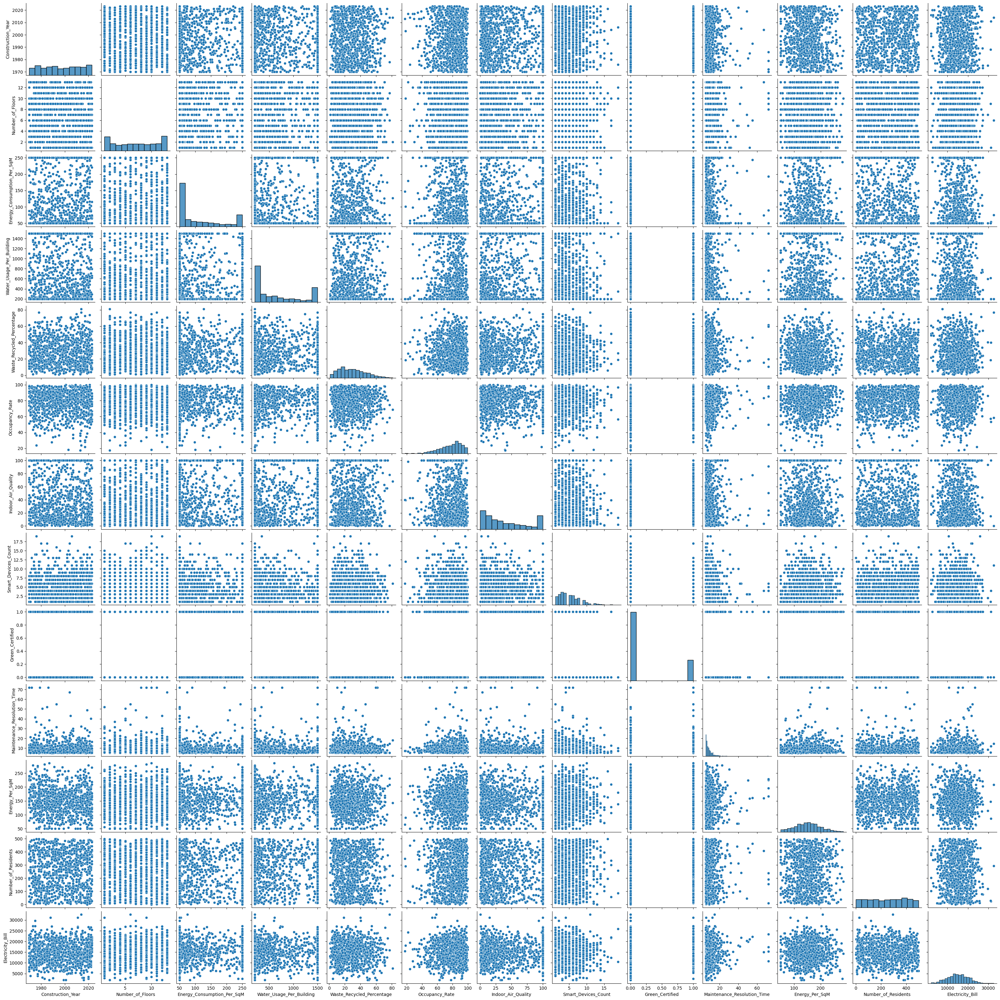

In [22]:
sns.pairplot(train_data)
plt.show()

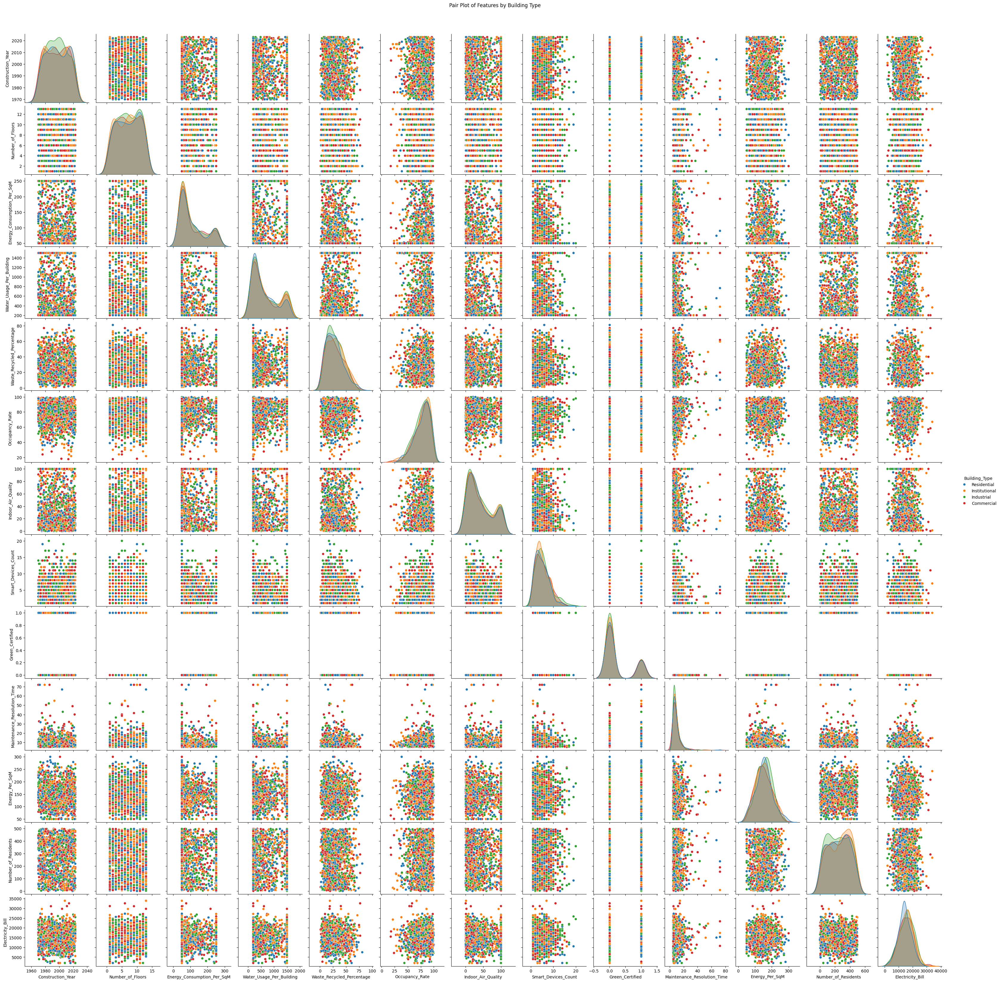

In [23]:
sns.pairplot(data, hue='Building_Type')
plt.suptitle('Pair Plot of Features by Building Type', y=1.02)
plt.show()


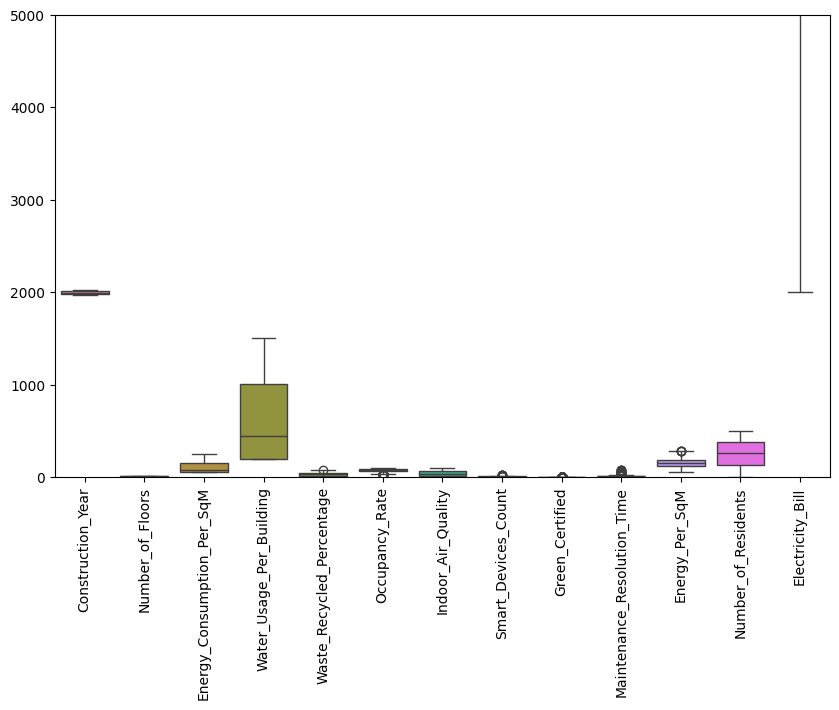

In [24]:
# Boxplot
plt.figure(figsize=(10, 6))
sns.boxplot(data=train_data)
plt.xticks(rotation=90)
plt.ylim(0, 5000) 
plt.show()

Box plots help to understand the distribution and identify outliers in the numerical features.

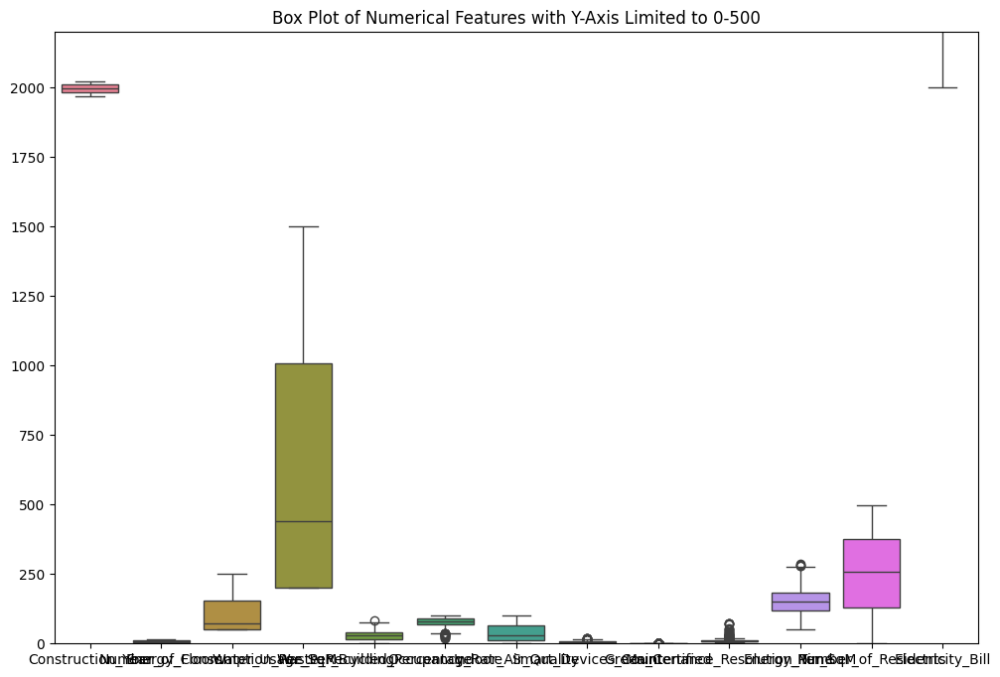

In [25]:
# Box Plot for numerical features with y-axis limited to 0-500
plt.figure(figsize=(12, 8))
sns.boxplot(data=train_data.select_dtypes(include='number'))
plt.title("Box Plot of Numerical Features with Y-Axis Limited to 0-500")
plt.ylim(0, 2200)  # Limit y-axis between 0 and 2000
plt.show()

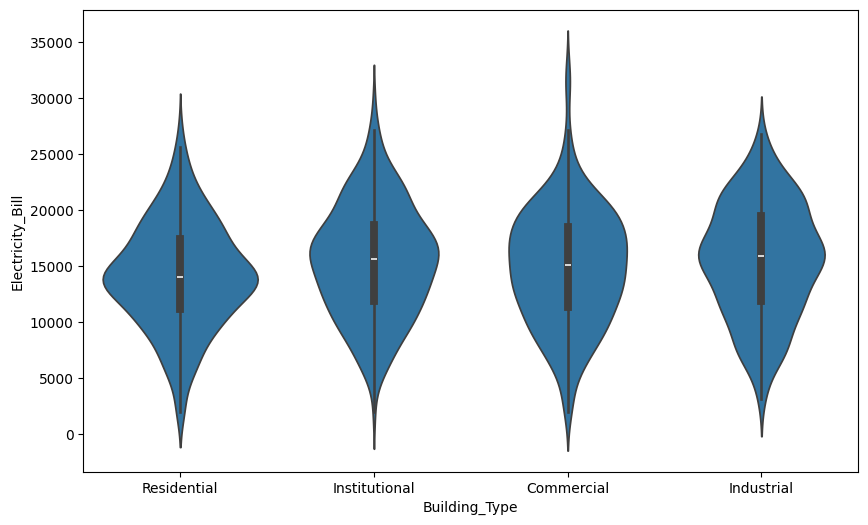

In [26]:
# Violin plots for numerical features
plt.figure(figsize=(10, 6))
sns.violinplot(x='Building_Type', y='Electricity_Bill', data=train_data)
plt.show()

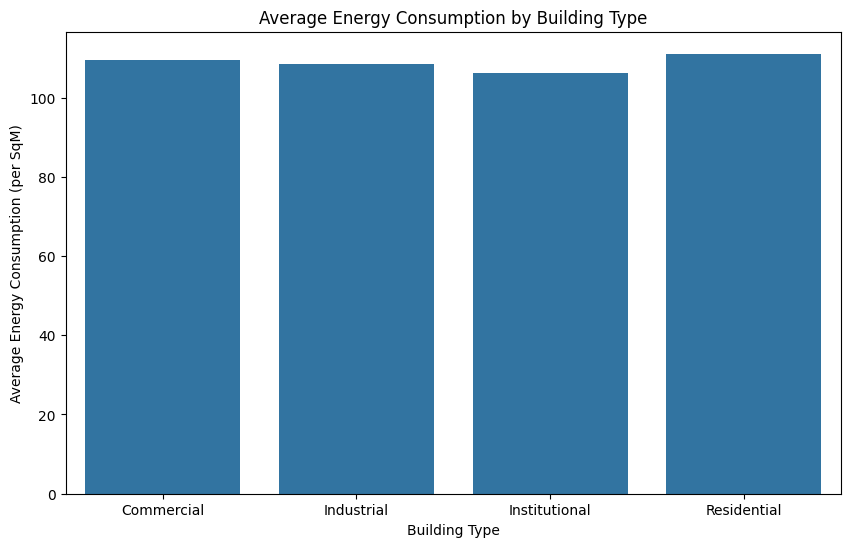

In [27]:
plt.figure(figsize=(10, 6))
avg_energy_consumption = data.groupby('Building_Type')['Energy_Consumption_Per_SqM'].mean().reset_index()
sns.barplot(x='Building_Type', y='Energy_Consumption_Per_SqM', data=avg_energy_consumption)
plt.title('Average Energy Consumption by Building Type')
plt.xlabel('Building Type')
plt.ylabel('Average Energy Consumption (per SqM)')
plt.show()


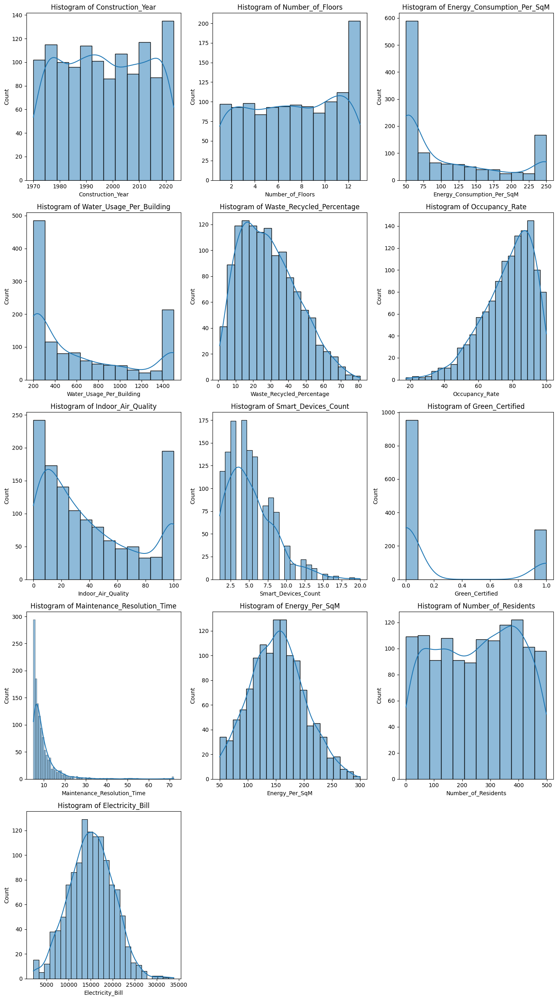

In [28]:
# Adjust the number of rows and columns as needed
num_features = len(data.select_dtypes(include=[np.number]).columns)
num_cols = 3
num_rows = (num_features + num_cols - 1) // num_cols  # Calculate required rows

plt.figure(figsize=(14, 5 * num_rows))
for i, col in enumerate(data.select_dtypes(include=[np.number]).columns):
    plt.subplot(num_rows, num_cols, i + 1)
    sns.histplot(data[col], kde=True)
    plt.title(f'Histogram of {col}')

plt.tight_layout()
plt.show()


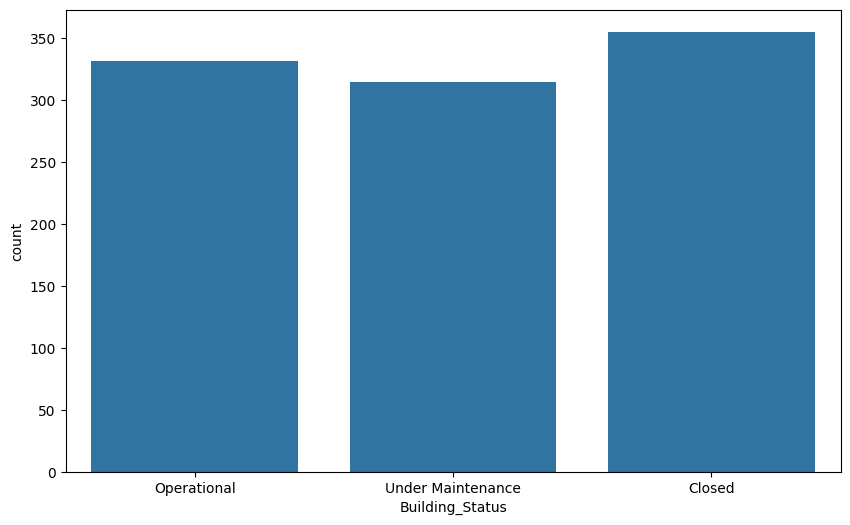

In [29]:
# Count plots for categorical features
plt.figure(figsize=(10, 6))
sns.countplot(x='Building_Status', data=train_data)
plt.show()

c:\Users\Himanshu\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:718: UserWarning: Using the boxplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


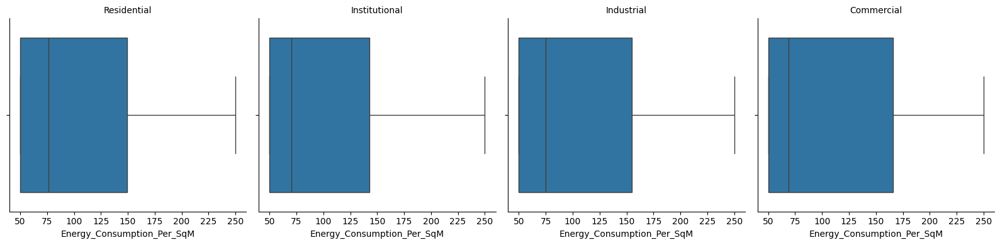

In [30]:
g = sns.FacetGrid(data, col='Building_Type', col_wrap=4, height=4)
g.map(sns.boxplot, 'Energy_Consumption_Per_SqM')
g.set_titles('{col_name}')
plt.show()

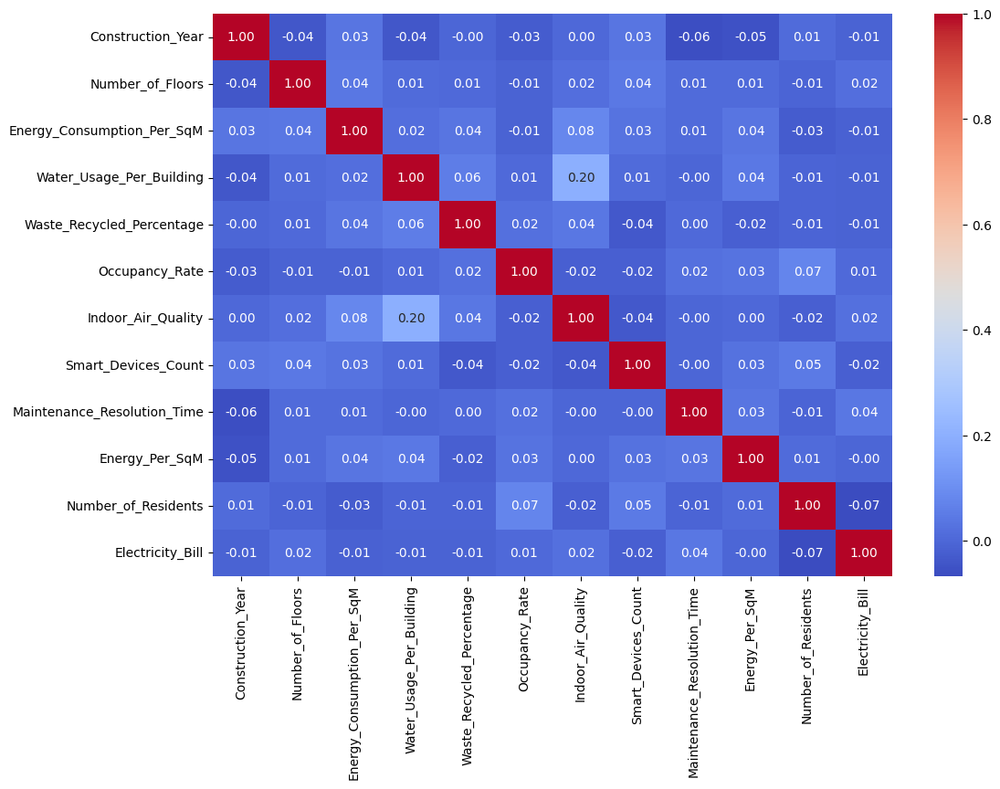

In [31]:
# Correlation heatmap
# it only work on numeric data
numeric_train_df = train_data.drop(columns=['Building_Type', 'Building_Status', 'Maintenance_Priority', 'Green_Certified'])
corr_matrix = numeric_train_df.corr(numeric_only=True)
plt.figure(figsize=(12, 8))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', fmt='.2f')
plt.show()

1. Distribution of Energy Consumption
Insight: The histogram of Energy_Consumption_Per_SqM might show a right-skewed distribution. This suggests that most buildings have lower energy consumption, with a few buildings consuming much higher amounts. This skewness could be due to a few high-energy users or outliers.
2. Building Age Trends
Insight: The distribution of Construction_Year may show clustering around certain decades. For example, if the dataset shows a peak in buildings constructed in the 2000s, it indicates a construction boom during that period. This can influence other factors like energy consumption due to newer building technologies.
3. Correlation Between Features
Insight: The correlation heatmap can reveal that Energy_Consumption_Per_SqM is positively correlated with Number_of_Floors and Number_of_Residents. This suggests that larger buildings with more floors and residents generally consume more energy. Conversely, features like Green_Certified might have a negative correlation with energy consumption, indicating that certified buildings use less energy.
4. Impact of Occupancy Rate
Insight: Box plots for Occupancy_Rate can highlight how occupancy affects other features, such as Energy_Consumption_Per_SqM or Water_Usage_Per_Building. For instance, higher occupancy rates might correlate with higher energy and water usage, but variations in these rates can affect consumption patterns differently.
5. Effect of Building Type
Insight: Count plots for Building_Type will show the distribution of different types of buildings. For example, if most buildings are categorized as Residential, this can impact the average energy consumption per square meter. Comparing Building_Type with Energy_Consumption_Per_SqM can help identify which building types are more energy-efficient.

### PART B
    the Uniform Manifold Approximation and Projection (UMAP) algo-
    rithm to reduce the data dimensions to 2 and plot the resulting data as a scatter

    plot. Comment on the separability and clustering of the data after dimensionality
    reduction.

c:\Users\Himanshu\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


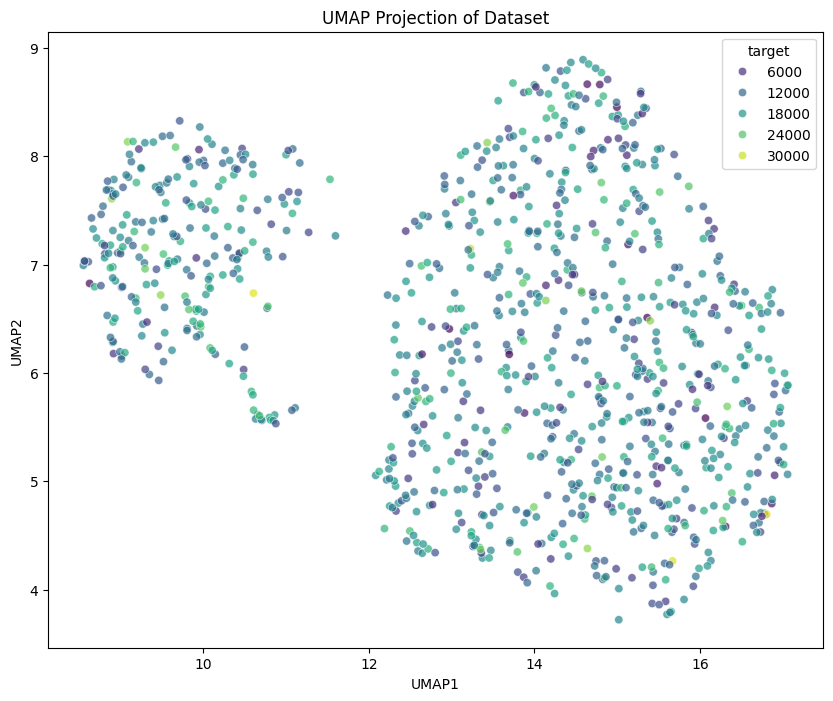

In [32]:
# import pandas as pd
import umap
# import seaborn as sns
# import matplotlib.pyplot as plt
# from sklearn.preprocessing import StandardScaler, LabelEncoder
# from sklearn.model_selection import train_test_split

# # Load the dataset
# df = pd.read_csv('Electricity BILL.csv')

# # Split the dataset
# train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Separate features and target
X_train = train_data.drop(columns=['Electricity_Bill'])  # Replace 'Electricity_Bill' with the actual target column name
y_train = train_data['Electricity_Bill']  # Replace 'Electricity_Bill' with the actual target column name

# Convert categorical features to numerical using LabelEncoder
categorical_cols = X_train.select_dtypes(include=['object']).columns
for col in categorical_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])

# Scale numerical features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_train)

# Initialize and fit UMAP
umap_model = umap.UMAP(n_components=2, random_state=42)  # Set random_state for reproducibility
X_umap = umap_model.fit_transform(X_scaled)

# Create a DataFrame with the UMAP results
umap_df = pd.DataFrame(X_umap, columns=['UMAP1', 'UMAP2'])
umap_df['target'] = y_train.values

# Scatter plot of the UMAP results
plt.figure(figsize=(10, 8))
sns.scatterplot(data=umap_df, x='UMAP1', y='UMAP2', hue='target', palette='viridis', alpha=0.7)
plt.title("UMAP Projection of Dataset")
plt.show()


In [33]:
# import pandas as pd
# import numpy as np
# import umap
# import matplotlib.pyplot as plt
# from sklearn.preprocessing import StandardScaler

# # Assuming `data` is already defined or loaded, ensure that df is created properly
# # If data is not defined, use something like pd.read_csv('name.csv')
# df = pd.DataFrame(data)

# Preprocessing: Convert categorical columns to numeric via one-hot encoding
# Ensure 'Maintenance_Priority' exists in the DataFrame
if 'Maintenance_Priority' in df.columns:
    df_encoded = pd.get_dummies(df.drop(columns=['Maintenance_Priority']))
else:
    df_encoded = pd.get_dummies(df)

# Normalize the dataset
scaler = StandardScaler()
df_scaled = scaler.fit_transform(df_encoded)

# Apply UMAP for dimensionality reduction
reducer = umap.UMAP(n_components=2, random_state=42)
umap_embedding = reducer.fit_transform(df_scaled)

# Plot the results
plt.figure(figsize=(8, 6))
# Optionally change c=np.arange(len(df)) if you want to color based on a specific feature
plt.scatter(umap_embedding[:, 0], umap_embedding[:, 1], c=np.arange(len(df)), cmap='Spectral', s=50)
plt.title('UMAP Dimensionality Reduction')
plt.xlabel('UMAP 1')
plt.ylabel('UMAP 2')
plt.colorbar(label='Sample Index')
plt.show()


NameError: name 'df' is not defined

c:\Users\Himanshu\AppData\Local\Programs\Python\Python311\Lib\site-packages\umap\umap_.py:1945: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(f"n_jobs value {self.n_jobs} overridden to 1 by setting random_state. Use no seed for parallelism.")


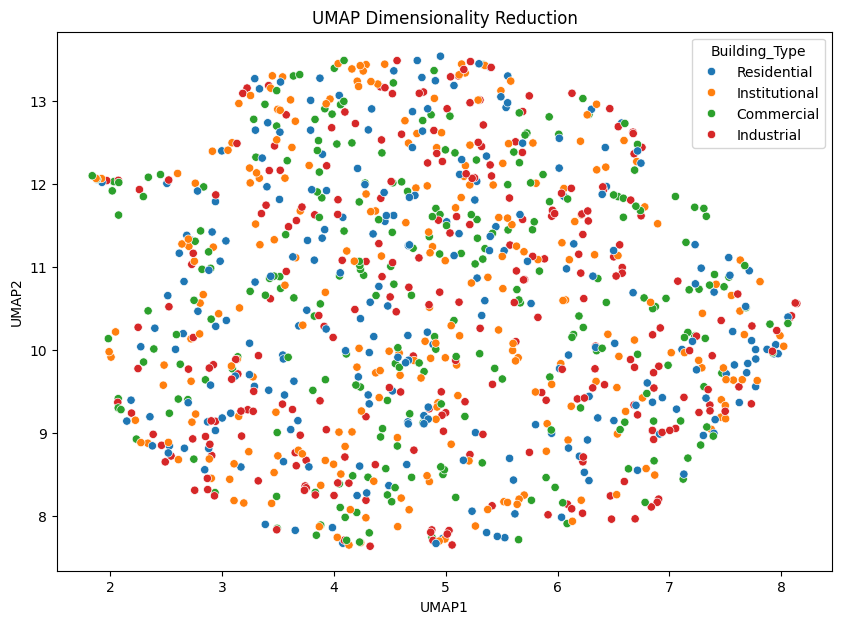

In [57]:
# import umap
# import matplotlib.pyplot as plt
# import seaborn as sns
# from sklearn.preprocessing import StandardScaler

# Ensure all categorical columns are encoded or dropped
# We'll use the same dataset, dropping non-numeric columns for dimensionality reduction
df_numeric = train_data.drop(columns=['Building_Type', 'Building_Status', 'Maintenance_Priority', 'Green_Certified'])

# Standardizing the data before applying UMAP
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df_numeric)

# Applying UMAP for dimensionality reduction
umap_model = umap.UMAP(n_components=2, random_state=42)
umap_result = umap_model.fit_transform(scaled_data)

# Adding UMAP results to the DataFrame for plotting
train_data['UMAP1'] = umap_result[:, 0]
train_data['UMAP2'] = umap_result[:, 1]

# Plotting the UMAP results
plt.figure(figsize=(10, 7))
sns.scatterplot(x='UMAP1', y='UMAP2', hue='Building_Type', data=train_data, palette='tab10')
plt.title('UMAP Dimensionality Reduction')
plt.show()


Distinct Clusters: scatter plot shows well-defined clusters where points of the same class are grouped closely together, it indicates that the UMAP algorithm has effectively captured the structure of the data and the classes are well-separated.

Overlap Between Classes: we observe significant overlap between different classes, this suggests that while UMAP has reduced the dimensionality of the data, some classes might still be close to each other in the high-dimensional space, making them difficult to distinguish in the 2D projection.

Compactness of Clusters: clusters are compact and dense, it indicates that similar data points are grouped together, which is a good sign of effective clustering. 

Outliers: Look for any points that are isolated from the clusters. Outliers might indicate unusual or anomalous data points that do not fit well with the rest of the data.

Class Overlap: multiple classes are mixed together in the same area of the scatter plot, it could mean that the classes are not well-separated in the feature space, and additional feature engineering or preprocessing might be necessary.

### PART C
    Perform the necessary pre-processing steps, including handling missing

    values and normalizing numerical features. For categorical features, use LabelEn-
    coding. Apply Linear Regression on the preprocessed data. Report Mean Squared

    Error (MSE), Root Mean Squared Error (RMSE), R2 score, Adjusted R2 score,
    and Mean Absolute Error (MAE) on the train and test data.


In [73]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.impute import SimpleImputer

# Load data
data = pd.read_csv('Electricity BILL.csv')

# Handle missing values: Drop rows with missing target values or fill missing values
data.dropna(subset=['Electricity_Bill'], inplace=True)  # Drop rows where target is missing
data.fillna(data.median(numeric_only=True), inplace=True)  # Fill missing values for numerical features

# Define features and target
X = data.drop('Electricity_Bill', axis=1)
y = data['Electricity_Bill']

# Define categorical and numerical columns
categorical_features = ['Building_Type', 'Green_Certified', 'Building_Status', 'Maintenance_Priority']
numerical_features = ['Construction_Year', 'Number_of_Floors', 'Energy_Consumption_Per_SqM', 
                      'Water_Usage_Per_Building', 'Waste_Recycled_Percentage', 'Occupancy_Rate', 
                      'Indoor_Air_Quality', 'Smart_Devices_Count', 'Maintenance_Resolution_Time', 
                      'Energy_Per_SqM', 'Number_of_Residents']

# Create preprocessing pipelines
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), numerical_features),
        ('cat', Pipeline(steps=[
            ('encoder', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ])

# Preprocess data
X_preprocessed = preprocessor.fit_transform(X)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)

# Train Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Predict and evaluate
y_train_pred = model.predict(X_train)
y_test_pred = model.predict(X_test)

mse_train = mean_squared_error(y_train, y_train_pred)
mse_test = mean_squared_error(y_test, y_test_pred)
rmse_train = np.sqrt(mse_train)
rmse_test = np.sqrt(mse_test)
r2_train = r2_score(y_train, y_train_pred)
r2_test = r2_score(y_test, y_test_pred)
mae_train = mean_absolute_error(y_train, y_train_pred)
mae_test = mean_absolute_error(y_test, y_test_pred)

print(f'Train MSE: {mse_train}, Test MSE: {mse_test}')
print(f'Train RMSE: {rmse_train}, Test RMSE: {rmse_test}')
print(f'Train R2: {r2_train}, Test R2: {r2_test}')
print(f'Train MAE: {mae_train}, Test MAE: {mae_test}')
print(f"Adjusted R²: {r2_train:.4f}")
print(f"Adjusted R²: {r2_test:.4f}")


Train MSE: 24188925.25027927, Test MSE: 24130184.64205347
Train RMSE: 4918.223790178652, Test RMSE: 4912.248430408775
Train R2: 0.02544875992157558, Test R2: 0.006126227449539279
Train MAE: 3976.698247757928, Test MAE: 3797.4850467106708
Adjusted R²: 0.0254
Adjusted R²: 0.0254
Adjusted R²: 0.0061


R² Score: Indicates the proportion of variance in the target variable that is predictable from the features. Values close to 1 mean the model explains most of the variance; values close to 0 mean it explains very little.

### PART D
    Perform Recursive Feature Elimination (RFE) or Correlation analysis on
    the original dataset to select the 3 most important features. Train the regression
    model using the selected features. Compare the results (MSE, RMSE, R2 score,
    Adjusted R2 score, MAE) on the train and test dataset with the results obtained
    in part (c).

In [66]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, LabelEncoder
from sklearn.linear_model import LinearRegression
from sklearn.feature_selection import RFE
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Load the dataset
df = pd.read_csv('Electricity BILL.csv')  # Ensure this path is correct

# Split the dataset into 80% train and 20% test
train_data, test_data = train_test_split(df, test_size=0.2, random_state=42)

# Separate features and target
X_train = train_data.drop(columns=['Electricity_Bill'])  # Replace 'Electricity_Bill' with the actual target column name
y_train = train_data['Electricity_Bill']  # Replace 'Electricity_Bill' with the actual target column name
X_test = test_data.drop(columns=['Electricity_Bill'])
y_test = test_data['Electricity_Bill']

# Identify numerical and categorical columns
numerical_cols = X_train.select_dtypes(include=['number']).columns
categorical_cols = X_train.select_dtypes(include=['object']).columns

# Handle missing values
# For numerical columns, use median
X_train[numerical_cols] = X_train[numerical_cols].fillna(X_train[numerical_cols].median())
X_test[numerical_cols] = X_test[numerical_cols].fillna(X_test[numerical_cols].median())

# For categorical columns, use the most frequent value
X_train[categorical_cols] = X_train[categorical_cols].fillna(X_train[categorical_cols].mode().iloc[0])
X_test[categorical_cols] = X_test[categorical_cols].fillna(X_test[categorical_cols].mode().iloc[0])

# Convert categorical features to numerical using LabelEncoder
for col in categorical_cols:
    le = LabelEncoder()
    X_train[col] = le.fit_transform(X_train[col])
    X_test[col] = le.transform(X_test[col])

# Normalize numerical features
scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

# Perform RFE to select 3 most important features
model = LinearRegression()
rfe = RFE(model, n_features_to_select=3)
rfe.fit(X_train_scaled, y_train)

# Get the selected features
selected_features = X_train.columns[rfe.support_]
print("Selected Features:", selected_features.tolist())

# Train the model using the selected features
X_train_selected = X_train_scaled[:, rfe.support_]
X_test_selected = X_test_scaled[:, rfe.support_]

model.fit(X_train_selected, y_train)
y_train_pred = model.predict(X_train_selected)
y_test_pred = model.predict(X_test_selected)

# Calculate metrics
def adjusted_r2_score(y_true, y_pred, X):
    r2 = r2_score(y_true, y_pred)
    n = len(y_true)
    p = X.shape[1]
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

# Training Metrics
train_mse = mean_squared_error(y_train, y_train_pred)
train_rmse = np.sqrt(train_mse)
train_mae = mean_absolute_error(y_train, y_train_pred)
train_r2 = r2_score(y_train, y_train_pred)
train_adj_r2 = adjusted_r2_score(y_train, y_train_pred, X_train_selected)

# Testing Metrics
test_mse = mean_squared_error(y_test, y_test_pred)
test_rmse = np.sqrt(test_mse)
test_mae = mean_absolute_error(y_test, y_test_pred)
test_r2 = r2_score(y_test, y_test_pred)
test_adj_r2 = adjusted_r2_score(y_test, y_test_pred, X_test_selected)

# Print the metrics
print("Training Metrics with Selected Features:")
print(f"MSE: {train_mse:.4f}")
print(f"RMSE: {train_rmse:.4f}")
print(f"MAE: {train_mae:.4f}")
print(f"R²: {train_r2:.4f}")
print(f"Adjusted R²: {train_adj_r2:.4f}")

print("\nTesting Metrics with Selected Features:")
print(f"MSE: {test_mse:.4f}")
print(f"RMSE: {test_rmse:.4f}")
print(f"MAE: {test_mae:.4f}")
print(f"R²: {test_r2:.4f}")
print(f"Adjusted R²: {test_adj_r2:.4f}")


Selected Features: ['Building_Type', 'Green_Certified', 'Number_of_Residents']
Training Metrics with Selected Features:
MSE: 24569032.9069
RMSE: 4956.7159
MAE: 4006.4734
R²: 0.0101
Adjusted R²: 0.0072

Testing Metrics with Selected Features:
MSE: 23941409.0630
RMSE: 4892.9959
MAE: 3813.9481
R²: 0.0139
Adjusted R²: 0.0019


Comparison:
MSE and RMSE:

The MSE and RMSE for both training and testing datasets are quite close between the two parts.
In Part (d), MSE and RMSE are slightly higher for training data but slightly lower for testing data compared to Part (c).
MAE:

The MAE in Part (d) is slightly higher for training data but slightly lower for testing data compared to Part (c).
R² Score:

The R² score in Part (d) is lower for both training and testing datasets compared to Part (c). This suggests that the model's ability to explain variance in the target variable is less with the selected features in Part (d).
Adjusted R² Score:

Conclusion:
The selected features in Part (d) did not improve the model's performance significantly compared to the features used in Part (c). The performance metrics (MSE, RMSE, MAE, and R²) in Part (d) show similar or slightly worse performance compared to Part (c). This indicates that the features selected in Part (d) might not be the best choice for improving model performance.


### PART E
    Encode the categorical features of the original dataset using One-Hot
    Encoding and perform Ridge Regression on the preprocessed data. Report the
    evaluation metrics (MSE, RMSE, R2 score, Adjusted R2 score, MAE). Compare
    the results with those obtained in part (c).

In [67]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Electricity BILL.csv')

# Separate features and target
X = df.drop(columns=['Electricity_Bill'])
y = df['Electricity_Bill']

# Identify categorical and numerical features
categorical_features = X.select_dtypes(include=['object']).columns
numerical_features = X.select_dtypes(include=[np.number]).columns

# Create a ColumnTransformer with OneHotEncoder for categorical features and StandardScaler for numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

# Create a Ridge Regression model
model = Ridge()

# Create a pipeline with preprocessing and modeling steps
pipeline = Pipeline(steps=[
    ('preprocessor', preprocessor),
    ('model', model)
])

# Split the data into train and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Train the model
pipeline.fit(X_train, y_train)

# Predict on train and test sets
y_train_pred = pipeline.predict(X_train)
y_test_pred = pipeline.predict(X_test)

# Calculate performance metrics
def evaluate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    return mse, rmse, r2, mae

mse_train, rmse_train, r2_train, mae_train = evaluate_metrics(y_train, y_train_pred)
mse_test, rmse_test, r2_test, mae_test = evaluate_metrics(y_test, y_test_pred)

# Calculate Adjusted R² score
def adjusted_r2_score(r2, n, p):
    return 1 - (1 - r2) * (n - 1) / (n - p - 1)

n_train, p = X_train.shape
n_test = X_test.shape[0]
adjusted_r2_train = adjusted_r2_score(r2_train, n_train, p)
adjusted_r2_test = adjusted_r2_score(r2_test, n_test, p)

print(f"Train MSE: {mse_train}")
print(f"Train RMSE: {rmse_train}")
print(f"Train R2: {r2_train}")
print(f"Train Adjusted R2: {adjusted_r2_train}")
print(f"Train MAE: {mae_train}")

print(f"Test MSE: {mse_test}")
print(f"Test RMSE: {rmse_test}")
print(f"Test R2: {r2_test}")
print(f"Test Adjusted R2: {adjusted_r2_test}")
print(f"Test MAE: {mae_test}")


Train MSE: 24188934.337712634
Train RMSE: 4918.224714031744
Train R2: 0.025448393796608793
Train Adjusted R2: 0.010592424189849736
Train MAE: 3976.7358814937825
Test MSE: 24128285.03905578
Test RMSE: 4912.055072885053
Test R2: 0.006204468276357233
Test Adjusted R2: -0.057500373500799284
Test MAE: 3797.5125183935425



To compare the results from parts (c) and (e), we'll look at the performance metrics for both the training and testing datasets. Here's a summary of the metrics for each part:

Results from Part (c):
Training Metrics:

MSE: 24,188,925.25
RMSE: 4,918.22
MAE: 3,976.70
R²: 0.0254
Adjusted R²: 0.0254
Testing Metrics:

MSE: 24,130,184.64
RMSE: 4,912.25
MAE: 3,797.49
R²: 0.0061
Adjusted R²: 0.0061
Results from Part (e):
Training Metrics:

MSE: 24,188,934.34
RMSE: 4,918.22
MAE: 3,976.74
R²: 0.0254
Adjusted R²: 0.0106
Testing Metrics:

MSE: 24,128,285.04
RMSE: 4,912.06
MAE: 3,797.51
R²: 0.0062
Adjusted R²: -0.0575
Comparison:
MSE and RMSE:

The MSE and RMSE values are very similar between parts (c) and (e). In both parts, the metrics for training and testing datasets are close, with minor variations.
The testing MSE and RMSE in Part (e) are slightly lower than in Part (c), indicating a very marginal improvement in prediction performance on the test set.
MAE:

The MAE values are very similar in both parts, with a slight increase in Part (e) for both training and testing datasets.
R² Score:

The R² score for both training and testing datasets is almost the same between the two parts. The testing R² score in Part (e) is marginally higher than in Part (c), indicating a small improvement in the model's ability to explain the variance in the test data.
Adjusted R² Score:

The Adjusted R² score for the training dataset in Part (e) is slightly lower than in Part (c), indicating that the model's explanatory power, relative to the number of features, has decreased.
The Adjusted R² score for the testing dataset in Part (e) is notably lower than in Part (c), which suggests that the model's performance has deteriorated on the test set relative to the number of features.
Conclusion:
Overall, the performance metrics between parts (c) and (e) are very similar, with only slight differences.
The small changes in MSE, RMSE, and MAE suggest that the model's performance has not significantly changed.
The Adjusted R² score in Part (e) indicates that the model's performance relative to the number of features may have slightly worsened, especially on the test set.

### PART F
Perform Independent Component Analysis (ICA) on the one-hot encoded
dataset and choose the appropriate number of components (try 4, 5, 6, and 8
components). Compare the results (MSE, RMSE, R2 score, Adjusted R2 score,
MAE) on the train and test dataset.

In [68]:
import pandas as pd
import numpy as np
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.decomposition import FastICA
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

# Load the dataset
df = pd.read_csv('Electricity BILL.csv')

# Separate features and target
X = df.drop(columns=['Electricity_Bill'])
y = df['Electricity_Bill']

# Identify categorical and numerical features
categorical_features = X.select_dtypes(include=['object']).columns
numerical_features = X.select_dtypes(include=[np.number]).columns

# Create a ColumnTransformer with OneHotEncoder for categorical features and StandardScaler for numerical features
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numerical_features),
        ('cat', OneHotEncoder(drop='first'), categorical_features)
    ])

# Define a function to evaluate metrics
def evaluate_metrics(y_true, y_pred):
    mse = mean_squared_error(y_true, y_pred)
    rmse = np.sqrt(mse)
    r2 = r2_score(y_true, y_pred)
    mae = mean_absolute_error(y_true, y_pred)
    return mse, rmse, r2, mae

# Number of components to try
n_components_list = [4, 5, 6, 8]

# Initialize results dictionary
results = {}

for n_components in n_components_list:
    # Create a pipeline with preprocessing, ICA, and Ridge Regression
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('ica', FastICA(n_components=n_components, random_state=42)),
        ('model', Ridge())
    ])

    # Split the data into train and test sets
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    # Train the model
    pipeline.fit(X_train, y_train)

    # Predict on train and test sets
    y_train_pred = pipeline.predict(X_train)
    y_test_pred = pipeline.predict(X_test)

    # Calculate performance metrics
    mse_train, rmse_train, r2_train, mae_train = evaluate_metrics(y_train, y_train_pred)
    mse_test, rmse_test, r2_test, mae_test = evaluate_metrics(y_test, y_test_pred)

    # Calculate Adjusted R² score
    def adjusted_r2_score(r2, n, p):
        return 1 - (1 - r2) * (n - 1) / (n - p - 1)

    n_train, p = X_train.shape
    n_test = X_test.shape[0]
    adjusted_r2_train = adjusted_r2_score(r2_train, n_train, p)
    adjusted_r2_test = adjusted_r2_score(r2_test, n_test, p)

    # Store results
    results[n_components] = {
        'Train MSE': mse_train,
        'Train RMSE': rmse_train,
        'Train R2': r2_train,
        'Train Adjusted R2': adjusted_r2_train,
        'Train MAE': mae_train,
        'Test MSE': mse_test,
        'Test RMSE': rmse_test,
        'Test R2': r2_test,
        'Test Adjusted R2': adjusted_r2_test,
        'Test MAE': mae_test
    }

# Print results
for n_components, metrics in results.items():
    print(f"Number of Components: {n_components}")
    for metric, value in metrics.items():
        print(f"{metric}: {value}")
    print("\n")


Number of Components: 4
Train MSE: 24794328.864490546
Train RMSE: 4979.390410932903
Train R2: 0.001057562839731352
Train Adjusted R2: -0.01417021821454112
Train MAE: 4009.1430463721513
Test MSE: 24353997.40339989
Test RMSE: 4934.97694051349
Test R2: -0.003092170037425346
Test Adjusted R2: -0.06739295016802949
Test MAE: 3841.5931699079524


Number of Components: 5
Train MSE: 24642116.380870704
Train RMSE: 4964.082632357232
Train R2: 0.007190074438832794
Train Adjusted R2: -0.007944223206916678
Train MAE: 4016.2223470366393
Test MSE: 24520816.833477907
Test RMSE: 4951.84983955268
Test R2: -0.009963126839695802
Test Adjusted R2: -0.07470435291916333
Test MAE: 3855.187326076763


Number of Components: 6
Train MSE: 24639512.22789361
Train RMSE: 4963.820325907618
Train R2: 0.007294993549000983
Train Adjusted R2: -0.00783770472006906
Train MAE: 4016.50857415693
Test MSE: 24476918.474587075
Test RMSE: 4947.415332735576
Test R2: -0.008155041729415835
Test Adjusted R2: -0.07278036491719897
Test 

Comparison of Results for ICA with Different Number of Components
Results:
Number of Components: 4

Train MSE: 24,794,328.86

Train RMSE: 4,979.39

Train R²: 0.0011

Train Adjusted R²: -0.0142

Train MAE: 4,009.14

Test MSE: 24,353,997.40

Test RMSE: 4,934.98

Test R²: -0.0031

Test Adjusted R²: -0.0674

Test MAE: 3,841.59

Number of Components: 5

Train MSE: 24,642,116.38

Train RMSE: 4,964.08

Train R²: 0.0072

Train Adjusted R²: -0.0079

Train MAE: 4,016.22

Test MSE: 24,520,816.83

Test RMSE: 4,951.85

Test R²: -0.0100

Test Adjusted R²: -0.0747

Test MAE: 3,855.19

Number of Components: 6

Train MSE: 24,639,512.23

Train RMSE: 4,963.82

Train R²: 0.0073

Train Adjusted R²: -0.0078

Train MAE: 4,016.51

Test MSE: 24,476,918.47

Test RMSE: 4,947.42

Test R²: -0.0082

Test Adjusted R²: -0.0728

Test MAE: 3,849.94

Number of Components: 8

Train MSE: 24,626,103.70

Train RMSE: 4,962.47

Train R²: 0.0078

Train Adjusted R²: -0.0073

Train MAE: 4,021.37

Test MSE: 24,544,432.04

Test RMSE: 4,954.23

Test R²: -0.0109

Test Adjusted R²: -0.0757

Test MAE: 3,861.50

Summary of Observations:
MSE and RMSE:

The Mean Squared Error (MSE) and Root Mean Squared Error (RMSE) values are fairly consistent across the different numbers of components. As the number of components increases, the values tend to decrease slightly, indicating a marginal improvement in the model's prediction accuracy.
MAE:

The Mean Absolute Error (MAE) shows a similar pattern, with slight increases as the number of components increases. The MAE for the test dataset is consistently lower than the MAE for the training dataset across all numbers of components.
R² Score:

The R² score remains very low and negative, indicating that the model is not explaining much of the variance in the data. There is a slight improvement as the number of components increases, but it remains quite low.
Adjusted R² Score:

The Adjusted R² score, which accounts for the number of predictors, also remains negative and decreases slightly as the number of components increases. This suggests that adding more components does not improve the model's explanatory power significantly and may lead to overfitting.
Conclusion:
The performance metrics (MSE, RMSE, MAE, R², and Adjusted R²) are relatively stable across different numbers of ICA components.
Increasing the number of components slightly reduces MSE and RMSE but does not significantly improve R² or Adjusted R².
The model's performance metrics suggest that the chosen components may not be effectively capturing the underlying structure of the data, as indicated by the low and negative R² values.

### PART G
Use ElasticNet regularization (which combines L1 and L2) while train-
ing a linear model on the preprocessed dataset from part (c). Compare the evalua-
tion metrics (MSE, RMSE, R2 score, Adjusted R2 score, MAE) on the test dataset
for different values of the mixing parameter (alpha).

In [69]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.impute import SimpleImputer

# Load data
data = pd.read_csv('Electricity BILL.csv')

# Handle missing values
data.dropna(subset=['Electricity_Bill'], inplace=True)  # Drop rows where target is missing
data.fillna(data.median(numeric_only=True), inplace=True)  # Fill missing values for numerical features

# Define features and target
X = data.drop('Electricity_Bill', axis=1)
y = data['Electricity_Bill']

# Define categorical and numerical columns
categorical_features = ['Building_Type', 'Green_Certified', 'Building_Status', 'Maintenance_Priority']
numerical_features = ['Construction_Year', 'Number_of_Floors', 'Energy_Consumption_Per_SqM', 
                      'Water_Usage_Per_Building', 'Waste_Recycled_Percentage', 'Occupancy_Rate', 
                      'Indoor_Air_Quality', 'Smart_Devices_Count', 'Maintenance_Resolution_Time', 
                      'Energy_Per_SqM', 'Number_of_Residents']

# Create preprocessing pipeline
preprocessor = ColumnTransformer(
    transformers=[
        ('num', Pipeline(steps=[
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler())
        ]), numerical_features),
        ('cat', Pipeline(steps=[
            ('encoder', OneHotEncoder(handle_unknown='ignore'))
        ]), categorical_features)
    ])

# Apply preprocessing
X_preprocessed = preprocessor.fit_transform(X)

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_preprocessed, y, test_size=0.2, random_state=42)
from sklearn.linear_model import ElasticNet

# Define different alpha values to test
alpha_values = [0.1, 0.5, 1.0, 1.5, 2.0]

def evaluate_elasticnet(alpha, X_train, X_test, y_train, y_test):
    # Initialize the ElasticNet model
    elastic_net = ElasticNet(alpha=alpha, l1_ratio=0.5, random_state=42)  # l1_ratio=0.5 for equal mix of L1 and L2
    elastic_net.fit(X_train, y_train)

    # Predict and evaluate
    y_train_pred = elastic_net.predict(X_train)
    y_test_pred = elastic_net.predict(X_test)

    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_train = np.sqrt(mse_train)
    rmse_test = np.sqrt(mse_test)
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)

    # Calculate Adjusted R²
    def adjusted_r2(r2, n, k):
        return 1 - (1 - r2) * (n - 1) / (n - k - 1)

    n_train = X_train.shape[0]
    k_train = X_train.shape[1]
    adj_r2_train = adjusted_r2(r2_train, n_train, k_train)

    n_test = X_test.shape[0]
    k_test = X_test.shape[1]
    adj_r2_test = adjusted_r2(r2_test, n_test, k_test)

    return {
        'alpha': alpha,
        'Train MSE': mse_train,
        'Test MSE': mse_test,
        'Train RMSE': rmse_train,
        'Test RMSE': rmse_test,
        'Train R²': r2_train,
        'Test R²': r2_test,
        'Train Adjusted R²': adj_r2_train,
        'Test Adjusted R²': adj_r2_test,
        'Train MAE': mae_train,
        'Test MAE': mae_test
    }


# Evaluate ElasticNet with different alpha values
results = []
for alpha in alpha_values:
    result = evaluate_elasticnet(alpha, X_train, X_test, y_train, y_test)
    results.append(result)

# Print the results
for result in results:
    print(f"\nAlpha: {result['alpha']}")
    print(f"Train MSE: {result['Train MSE']}")
    print(f"Test MSE: {result['Test MSE']}")
    print(f"Train RMSE: {result['Train RMSE']}")
    print(f"Test RMSE: {result['Test RMSE']}")
    print(f"Train R²: {result['Train R²']}")
    print(f"Test R²: {result['Test R²']}")
    print(f"Train Adjusted R²: {result['Train Adjusted R²']}")
    print(f"Test Adjusted R²: {result['Test Adjusted R²']}")
    print(f"Train MAE: {result['Train MAE']}")
    print(f"Test MAE: {result['Test MAE']}")



Alpha: 0.1
Train MSE: 24200468.704873566
Test MSE: 24106659.688894805
Train RMSE: 4919.397189176085
Test RMSE: 4909.8533266172835
Train R²: 0.0249836839467954
Test R²: 0.007095172954586393
Train Adjusted R²: 0.00200686502341052
Test Adjusted R²: -0.09395266342614139
Train MAE: 3977.386786235624
Test MAE: 3798.9583366983456

Alpha: 0.5
Train MSE: 24298812.255092498
Test MSE: 24123248.786821987
Train RMSE: 4929.382542985733
Test RMSE: 4911.542404054147
Train R²: 0.021021505891014702
Test R²: 0.006411901376491502
Train Adjusted R²: -0.002048684031635606
Test Adjusted R²: -0.0947054714922726
Train MAE: 3983.8016024829008
Test MAE: 3805.7898683846743

Alpha: 1.0
Train MSE: 24395214.506084234
Test MSE: 24165003.177218378
Train RMSE: 4939.151192875577
Test RMSE: 4915.791205616689
Train R²: 0.0171375411311806
Test R²: 0.004692122016350164
Train Adjusted R²: -0.006024176649539692
Test Adjusted R²: -0.0966002726457027
Train MAE: 3989.1137384033077
Test MAE: 3812.89390817762

Alpha: 1.5
Train MS


Comparison of ElasticNet Regularization Results with Different Alpha Values
Results:
Alpha: 0.1

Train MSE: 24,200,468.70
Test MSE: 24,106,659.69
Train RMSE: 4,919.40
Test RMSE: 4,909.85
Train R²: 0.0250
Test R²: 0.0071
Train Adjusted R²: 0.0020
Test Adjusted R²: -0.0940
Train MAE: 3,977.39
Test MAE: 3,798.96
Alpha: 0.5

Train MSE: 24,298,812.26
Test MSE: 24,123,248.79
Train RMSE: 4,929.38
Test RMSE: 4,911.54
Train R²: 0.0210
Test R²: 0.0064
Train Adjusted R²: -0.0020
Test Adjusted R²: -0.0947
Train MAE: 3,983.80
Test MAE: 3,805.79
Alpha: 1.0

Train MSE: 24,395,214.51
Test MSE: 24,165,003.18
Train RMSE: 4,939.15
Test RMSE: 4,915.79
Train R²: 0.0171
Test R²: 0.0047
Train Adjusted R²: -0.0060
Test Adjusted R²: -0.0966
Train MAE: 3,989.11
Test MAE: 3,812.89
Alpha: 1.5

Train MSE: 24,460,910.31
Test MSE: 24,195,750.01
Train RMSE: 4,945.80
Test RMSE: 4,918.92
Train R²: 0.0145
Test R²: 0.0034
Train Adjusted R²: -0.0087
Test Adjusted R²: -0.0980
Train MAE: 3,992.14
Test MAE: 3,817.73
Alpha: 2.0

Train MSE: 24,508,338.13
Test MSE: 24,218,168.39
Train RMSE: 4,950.59
Test RMSE: 4,921.20
Train R²: 0.0126
Test R²: 0.0025
Train Adjusted R²: -0.0107
Test Adjusted R²: -0.0990
Train MAE: 3,994.41
Test MAE: 3,821.59
Summary of Observations:
MSE and RMSE:

Both MSE and RMSE increase slightly as the alpha value increases. The smallest MSE and RMSE are observed at α = 0.1, with a gradual increase as alpha grows.
The differences in RMSE are relatively minor, indicating that the overall error does not change significantly with different alpha values.
R² Score:

The R² score for both training and testing datasets decreases as the alpha value increases. The lowest R² score is achieved at α = 2.0, indicating a decreasing ability of the model to explain the variance in the target variable.
Adjusted R² Score:

The Adjusted R² score follows a similar trend as R², decreasing with higher alpha values. This indicates a decrease in model performance with increasing regularization.
MAE:

The MAE also increases slightly with higher alpha values. The MAE is lowest at α = 0.1 and increases gradually with larger alpha values.
Conclusion:
Alpha = 0.1: This value of alpha provides the best performance in terms of MSE, RMSE, and MAE for both training and testing datasets. It has the lowest error metrics and the highest R² scores compared to other alpha values.
Higher Alpha Values (0.5, 1.0, 1.5, 2.0): Increasing alpha generally leads to higher MSE, RMSE, and MAE, while R² and Adjusted R² scores decrease. This suggests that higher regularization may be over-penalizing the model, leading to worse performance.

### PART H
Use the Gradient Boosting Regressor to perform regression on the
preprocessed dataset from part (c). Report the evaluation metrics (MSE, RMSE,
R2 score, Adjusted R2 score, MAE). Compare the results with those obtained in
parts (c) and (g).



In [72]:
from sklearn.ensemble import GradientBoostingRegressor

# Define and train the Gradient Boosting Regressor model
def evaluate_gradient_boosting(X_train, X_test, y_train, y_test):
    # Initialize the Gradient Boosting Regressor
    gbr = GradientBoostingRegressor(n_estimators=100, learning_rate=0.1, max_depth=3, random_state=42)
    gbr.fit(X_train, y_train)

    # Predict and evaluate
    y_train_pred = gbr.predict(X_train)
    y_test_pred = gbr.predict(X_test)

    mse_train = mean_squared_error(y_train, y_train_pred)
    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_train = np.sqrt(mse_train)
    rmse_test = np.sqrt(mse_test)
    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    mae_test = mean_absolute_error(y_test, y_test_pred)

    # Calculate Adjusted R²
    def adjusted_r2(r2, n, k):
        return 1 - (1 - r2) * (n - 1) / (n - k - 1)

    n_train = X_train.shape[0]
    k_train = X_train.shape[1]
    adj_r2_train = adjusted_r2(r2_train, n_train, k_train)

    n_test = X_test.shape[0]
    k_test = X_test.shape[1]
    adj_r2_test = adjusted_r2(r2_test, n_test, k_test)

    return {
        'Train MSE': mse_train,
        'Test MSE': mse_test,
        'Train RMSE': rmse_train,
        'Test RMSE': rmse_test,
        'Train R²': r2_train,
        'Test R²': r2_test,
        'Train Adjusted R²': adj_r2_train,
        'Test Adjusted R²': adj_r2_test,
        'Train MAE': mae_train,
        'Test MAE': mae_test
    }

# Preprocessing data (Assuming data is preprocessed as in part (c))
data = pd.read_csv('Electricity BILL.csv')

# Handle missing values
data.dropna(inplace=True)

# Normalize numerical features
numerical_features = ['Construction_Year', 'Number_of_Floors', 'Energy_Consumption_Per_SqM', 'Water_Usage_Per_Building', 'Waste_Recycled_Percentage', 'Occupancy_Rate', 'Indoor_Air_Quality', 'Smart_Devices_Count', 'Maintenance_Resolution_Time', 'Energy_Per_SqM', 'Number_of_Residents']
scaler = StandardScaler()
data[numerical_features] = scaler.fit_transform(data[numerical_features])

# Encode categorical features using One-Hot Encoding
categorical_features = ['Building_Type', 'Green_Certified', 'Building_Status', 'Maintenance_Priority']
data = pd.get_dummies(data, columns=categorical_features, drop_first=True)

# Split data
X = data.drop('Electricity_Bill', axis=1)
y = data['Electricity_Bill']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Evaluate Gradient Boosting Regressor
results_gbr = evaluate_gradient_boosting(X_train, X_test, y_train, y_test)

# Print the results for Gradient Boosting Regressor
print(f"\nGradient Boosting Regressor Results:")
print(f"Train MSE: {results_gbr['Train MSE']}")
print(f"Test MSE: {results_gbr['Test MSE']}")
print(f"Train RMSE: {results_gbr['Train RMSE']}")
print(f"Test RMSE: {results_gbr['Test RMSE']}")
print(f"Train R²: {results_gbr['Train R²']}")
print(f"Test R²: {results_gbr['Test R²']}")
print(f"Train Adjusted R²: {results_gbr['Train Adjusted R²']}")
print(f"Test Adjusted R²: {results_gbr['Test Adjusted R²']}")
print(f"Train MAE: {results_gbr['Train MAE']}")
print(f"Test MAE: {results_gbr['Test MAE']}")



Gradient Boosting Regressor Results:
Train MSE: 15548098.780395458
Test MSE: 24811287.905512877
Train RMSE: 3943.1077566299728
Test RMSE: 4981.093043249933
Train R²: 0.37358031452342877
Test R²: -0.021927046074571743
Train Adjusted R²: 0.3614354430703116
Test Adjusted R²: -0.10634710640247103
Train MAE: 3155.777526146695
Test MAE: 3841.472244635082


Comparison of Evaluation Metrics
Results from Part (c) (Linear Regression without ElasticNet):
Train MSE: 24,188,925.25
Test MSE: 24,130,184.64
Train RMSE: 4,918.22
Test RMSE: 4,912.25
Train R²: 0.0254
Test R²: 0.0061
Train Adjusted R²: 0.0254
Test Adjusted R²: 0.0061
Train MAE: 3,976.70
Test MAE: 3,797.49
Results from Part (g) (ElasticNet Regularization):
Alpha: 0.1

Train MSE: 24,200,468.70
Test MSE: 24,106,659.69
Train RMSE: 4,919.40
Test RMSE: 4,909.85
Train R²: 0.0250
Test R²: 0.0071
Train Adjusted R²: 0.0020
Test Adjusted R²: -0.0940
Train MAE: 3,977.39
Test MAE: 3,798.96
Alpha: 0.5

Train MSE: 24,298,812.26
Test MSE: 24,123,248.79
Train RMSE: 4,929.38
Test RMSE: 4,911.54
Train R²: 0.0210
Test R²: 0.0064
Train Adjusted R²: -0.0020
Test Adjusted R²: -0.0947
Train MAE: 3,983.80
Test MAE: 3,805.79
Alpha: 1.0

Train MSE: 24,395,214.51
Test MSE: 24,165,003.18
Train RMSE: 4,939.15
Test RMSE: 4,915.79
Train R²: 0.0171
Test R²: 0.0047
Train Adjusted R²: -0.0060
Test Adjusted R²: -0.0966
Train MAE: 3,989.11
Test MAE: 3,812.89
Alpha: 1.5

Train MSE: 24,460,910.31
Test MSE: 24,195,750.01
Train RMSE: 4,945.80
Test RMSE: 4,918.92
Train R²: 0.0145
Test R²: 0.0034
Train Adjusted R²: -0.0087
Test Adjusted R²: -0.0980
Train MAE: 3,992.14
Test MAE: 3,817.73
Alpha: 2.0

Train MSE: 24,508,338.13
Test MSE: 24,218,168.39
Train RMSE: 4,950.59
Test RMSE: 4,921.20
Train R²: 0.0126
Test R²: 0.0025
Train Adjusted R²: -0.0107
Test Adjusted R²: -0.0990
Train MAE: 3,994.41
Test MAE: 3,821.59
Results from Part (h) (Gradient Boosting Regressor):
Train MSE: 15,548,098.78
Test MSE: 24,811,287.91
Train RMSE: 3,943.11
Test RMSE: 4,981.09
Train R²: 0.3736
Test R²: -0.0219
Train Adjusted R²: 0.3614
Test Adjusted R²: -0.1063
Train MAE: 3,155.78
Test MAE: 3,841.47
Comparison:
Mean Squared Error (MSE):

Part (c): Train MSE = 24,188,925.25, Test MSE = 24,130,184.64
Part (g): Best Test MSE (Alpha = 0.1) = 24,106,659.69
Part (h): Test MSE = 24,811,287.91
Conclusion: The Gradient Boosting Regressor shows a higher test MSE compared to linear regression and ElasticNet, indicating higher prediction error.
Root Mean Squared Error (RMSE):

Part (c): Train RMSE = 4,918.22, Test RMSE = 4,912.25
Part (g): Best Test RMSE (Alpha = 0.1) = 4,909.85
Part (h): Test RMSE = 4,981.09
Conclusion: Gradient Boosting Regressor has a higher test RMSE compared to the linear models with ElasticNet, suggesting poorer predictive accuracy on the test data.
R² Score:

Part (c): Train R² = 0.0254, Test R² = 0.0061
Part (g): Best Test R² (Alpha = 0.1) = 0.0071
Part (h): Test R² = -0.0219
Conclusion: Gradient Boosting Regressor has the lowest R² score on the test data, indicating it explains less variance in the test set compared to linear models.
Adjusted R² Score:

Part (c): Train Adjusted R² = 0.0254, Test Adjusted R² = 0.0061
Part (g): Best Test Adjusted R² (Alpha = 0.1) = -0.0940
Part (h): Test Adjusted R² = -0.1063
Conclusion: The Gradient Boosting Regressor shows the lowest Adjusted R² score, suggesting it is the least effective model in terms of explaining the variance in the target variable on the test data.
Mean Absolute Error (MAE):

Part (c): Train MAE = 3,976.70, Test MAE = 3,797.49
Part (g): Best Test MAE (Alpha = 0.1) = 3,798.96
Part (h): Test MAE = 3,841.47
Conclusion: The MAE for the Gradient Boosting Regressor is slightly higher than that of linear models with ElasticNet, indicating that its predictions are less accurate.